# Import Libraries

In [1]:
!pip install -q ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00


In [2]:
# Make sure git-lfs is installed (https://git-lfs.com)
!git lfs install

!git clone https://huggingface.co/alibaba-pai/VideoCLIP-XL
!git clone https://huggingface.co/alibaba-pai/VideoCLIP-XL-v2

Git LFS initialized.
Cloning into 'VideoCLIP-XL'...
remote: Enumerating objects: 25, done.
remote: Total 25 (delta 0), reused 0 (delta 0), pack-reused 25 (from 1)
Unpacking objects: 100% (25/25), 15.11 KiB | 1.89 MiB/s, done.
Cloning into 'VideoCLIP-XL-v2'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 9 (delta 1), reused 0 (delta 0), pack-reused 3 (from 1)
Unpacking objects: 100% (9/9), 2.46 KiB | 1.23 MiB/s, done.


In [3]:
!mv VideoCLIP-XL/* /kaggle/working

In [4]:
import random
import os
from typing import List
import glob
import time
from pathlib import Path

import pandas as pd
import numpy as np
import cv2
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn.functional as F
from modeling import VideoCLIP_XL
from utils.text_encoder import text_encoder

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.11/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


# Subset Preparation

In [5]:
DATA_DIR = os.path.join("/kaggle", "input", "ucf101-action-recognition")

TRAIN_DIR = os.path.join(DATA_DIR, "train")
VAL_DIR = os.path.join(DATA_DIR, "val")
TEST_DIR = os.path.join(DATA_DIR, "test")

In [6]:
train_df = pd.read_csv(os.path.join(DATA_DIR, "train.csv"))
train_df.head()

,clip_name,clip_path,label
0,v_Swing_g05_c02,/train/Swing/v_Swing_g05_c02.avi,Swing
1,v_Swing_g21_c03,/train/Swing/v_Swing_g21_c03.avi,Swing
2,v_Swing_g07_c01,/train/Swing/v_Swing_g07_c01.avi,Swing
3,v_Swing_g24_c04,/train/Swing/v_Swing_g24_c04.avi,Swing
4,v_Swing_g20_c03,/train/Swing/v_Swing_g20_c03.avi,Swing


In [7]:
test_df = pd.read_csv(os.path.join(DATA_DIR, "test.csv"))
test_df.head()

,clip_name,clip_path,label
0,v_Swing_g21_c02,/test/Swing/v_Swing_g21_c02.avi,Swing
1,v_Swing_g21_c06,/test/Swing/v_Swing_g21_c06.avi,Swing
2,v_Swing_g20_c05,/test/Swing/v_Swing_g20_c05.avi,Swing
3,v_Swing_g04_c03,/test/Swing/v_Swing_g04_c03.avi,Swing
4,v_Swing_g19_c03,/test/Swing/v_Swing_g19_c03.avi,Swing


## Get 5 Samples for Each Top 10 Classes

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


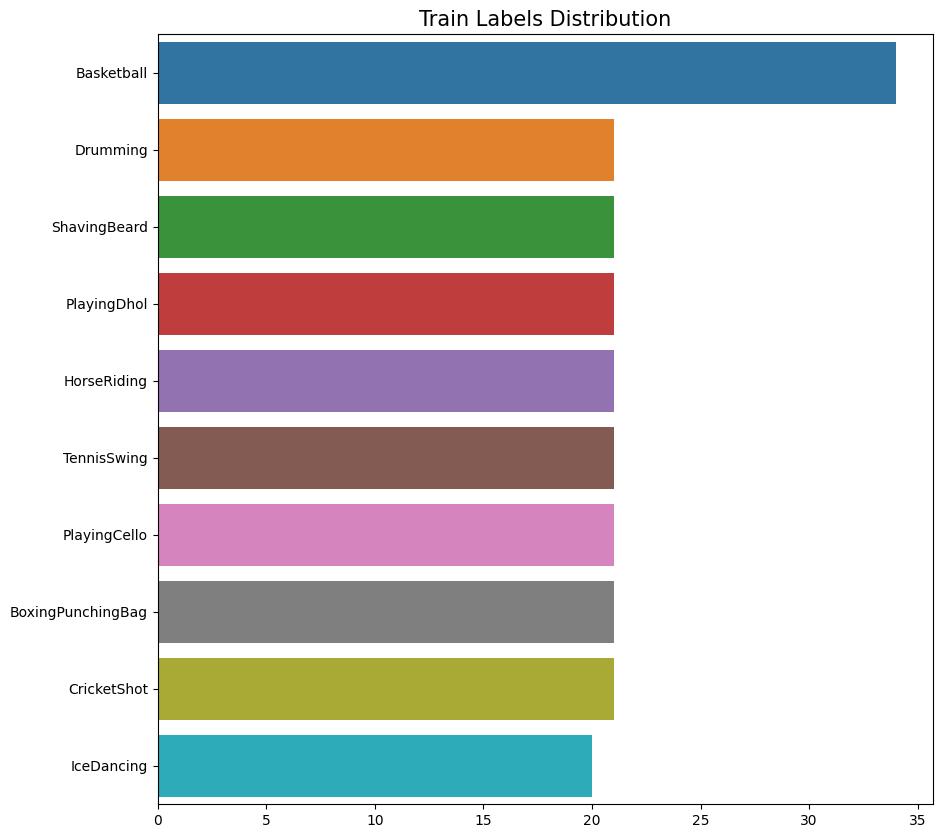

In [8]:
# get top 10 classes to pick as subset 
plt.figure(figsize=(10, 10))
plt.title('Train Labels Distribution', fontsize=15)
label_distribution = test_df['label'].value_counts().head(10)

sns.barplot(x=label_distribution.values,
            y=list(label_distribution.keys()),
            orient="h");

In [9]:
def get_video_sample(df, num_samples=5):
    top_10_labels = label_distribution.index
    num_samples = 1
    samples = []
    
    for label in top_10_labels:
        # filter rows for the current label and sample 5 rows
        label_samples = df[df['label'] == label].sample(num_samples)
        samples.append(label_samples)
    
    # concatenate the sampled dataframes into one
    df_samples = pd.concat(samples).reset_index(drop=True)
    return df_samples


video_zero_shot = get_video_sample(test_df, num_samples=1)
video_zero_shot

,clip_name,clip_path,label
0,v_BasketballDunk_g14_c01,/test/Basketball/v_BasketballDunk_g14_c01.avi,Basketball
1,v_Drumming_g23_c05,/test/Drumming/v_Drumming_g23_c05.avi,Drumming
2,v_ShavingBeard_g09_c06,/test/ShavingBeard/v_ShavingBeard_g09_c06.avi,ShavingBeard
3,v_PlayingDhol_g02_c03,/test/PlayingDhol/v_PlayingDhol_g02_c03.avi,PlayingDhol
4,v_HorseRiding_g07_c03,/test/HorseRiding/v_HorseRiding_g07_c03.avi,HorseRiding
5,v_TennisSwing_g12_c04,/test/TennisSwing/v_TennisSwing_g12_c04.avi,TennisSwing
6,v_PlayingCello_g23_c02,/test/PlayingCello/v_PlayingCello_g23_c02.avi,PlayingCello
7,v_BoxingPunchingBag_g09_c06,/test/BoxingPunchingBag/v_BoxingPunchingBag_g0...,BoxingPunchingBag
8,v_CricketShot_g24_c06,/test/CricketShot/v_CricketShot_g24_c06.avi,CricketShot
9,v_IceDancing_g13_c01,/test/IceDancing/v_IceDancing_g13_c01.avi,IceDancing


In [10]:
# show videos
from moviepy.editor import *

video_path = [DATA_DIR+i for i in video_zero_shot["clip_path"]]

clip1 = VideoFileClip(video_path[0])
clip2 = VideoFileClip(video_path[1])
clip3 = VideoFileClip(video_path[2])
clip4 = VideoFileClip(video_path[3])
clip5 = VideoFileClip(video_path[4])
clip6 = VideoFileClip(video_path[5])
clip7 = VideoFileClip(video_path[6])
clip8 = VideoFileClip(video_path[7])
clip9 = VideoFileClip(video_path[8])
clip10 = VideoFileClip(video_path[9])

# list of clips
clips = [
    [clip1, clip2],
    [clip3, clip4],
    [clip5, clip6],
    [clip7, clip8],
    [clip9, clip10],
]

# stacking clips
final = clips_array(clips)

# showing final clip
final.ipython_display(width=500)

error: XDG_RUNTIME_DIR not set in the environment.
ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1334:(snd_func_refer) error evaluating name
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5701:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2664:(snd_pcm_open_noupdate) Unknown PCM default
ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5178:(_snd_config_evalu

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Organize Video Clips and Action Labels

In [11]:
description = {
    'Basketball': 'A person shooting a basketball on a court.',
    'Drumming': 'A person is playing a drum at a concert.',
    'ShavingBeard': 'A person using a razor to shave his beard.',
    'PlayingDhol': 'A person energetically playing a dhol.',
    'HorseRiding': 'A person riding a horse at the field.',
    'TennisSwing': 'A person swinging a tennis racket to hit a tennis ball.',
    'PlayingCello': 'A person seated and playing the cello, a bowed string instrument, typically in a concert or rehearsal setting.',
    'BoxingPunchingBag': 'A person punching or training with a heavy bag in a gym or boxing environment.',
    'CricketShot': 'A person hitting a cricket ball with a bat, performing a shot during a match or practice.',
    'IceDancing': 'A pair or solo skater performing choreographed dance moves on ice, often in a competition or exhibition.'
}

In [12]:
list(label_distribution.index)

['Basketball',
 'Drumming',
 'ShavingBeard',
 'PlayingDhol',
 'HorseRiding',
 'TennisSwing',
 'PlayingCello',
 'BoxingPunchingBag',
 'CricketShot',
 'IceDancing']

In [13]:
texts = label_distribution.index
label2idx = {label: i for i, label in enumerate(texts)}
idx2label = {i: label for i, label in enumerate(texts)}

videos = [DATA_DIR + vid for vid in video_zero_shot['clip_path']]

# Preprocessing

In [14]:
def print_total_frames(video_path):
    """
    Opens the video using OpenCV and prints the total number of frames.

    Args:
        video_path (str): Path to the video file.
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error opening video file: {video_path}")
        return
    
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in '{video_path.split('/')[-1]}': {total_frames}")
    cap.release()
    

# /kaggle/input/ucf101-action-recognition/train/Diving
for vid_path in video_zero_shot['clip_path']:
    vid_path = f"/kaggle/input/ucf101-action-recognition{vid_path}"
    print_total_frames(str(vid_path))

Total frames in 'v_BasketballDunk_g14_c01.avi': 88
Total frames in 'v_Drumming_g23_c05.avi': 300
Total frames in 'v_ShavingBeard_g09_c06.avi': 208
Total frames in 'v_PlayingDhol_g02_c03.avi': 267
Total frames in 'v_HorseRiding_g07_c03.avi': 180
Total frames in 'v_TennisSwing_g12_c04.avi': 248
Total frames in 'v_PlayingCello_g23_c02.avi': 267
Total frames in 'v_BoxingPunchingBag_g09_c06.avi': 162
Total frames in 'v_CricketShot_g24_c06.avi': 69
Total frames in 'v_IceDancing_g13_c01.avi': 250


In [15]:
def _frame_from_video(video):
    """
    Continuously read frames from the video as long
    as it's open

    Args:
        video: cv2.VideoCapture = An OpenCV VideoCapture object representing the opened video.
    """
    while video.isOpened():
        success, frame = video.read()
        if success:
            yield frame
        else:
            break

# ImageNet normalization values for RGB channels
v_mean = np.array([0.485, 0.456, 0.406]).reshape(1,1,3)
v_std = np.array([0.229, 0.224, 0.225]).reshape(1,1,3)


def normalize(data):
    """
    Convert pixels (0-255) to normalized values 
    
    Args:
        data: np.ndarray = An image array of shape (H,W,3)
    
    Returns:
        np.ndarray = The normalized image of the same shape with standardized values per channel
    """
    return (data / 255.0 - v_mean) / v_std
        
    
def video_preprocessing(video_path, fnum=8):
    """
    Preprocesses a video by extracting and normalizing a fixed number of frames.

    Args:
        video_path (str) = Path to the input video file
        fnum (optional) (int) = Number of evenly spaced frames to extract from the video.

    Returns:
        vid_tube (torch.Tensor): A tensor of shape (1, fnum, 3, 224, 224) representing the processed video
            - 1: batch dims
            - fnum: number of frames
            - 3: RGB color channels
            - 224x224: frame size 
    """
    # open the video file 
    video = cv2.VideoCapture(video_path)
    # extract all frames from the video
    frames = [x for x in _frame_from_video(video)]
    # select 'fnum' evenly spaed frames throughout the video
    step = len(frames) // fnum
    frames = frames[::step][:fnum]

    vid_tube = []
    for fr in frames:
        # convert from BGR to RGB
        fr = fr[:,:,::-1]
        # resize frame to 224 x 224
        fr = cv2.resize(fr, (224,224))
        # expands dims of normalizes frame
        fr = np.expand_dims(normalize(fr), axis=(0,1))
        vid_tube.append(fr) 

    # concantenate frames into single tensor
    vid_tube = np.concatenate(vid_tube, axis=1)
    # rearranges dimensions to match (batch, time, channels, height, width)
    vid_tube = np.transpose(vid_tube, (0, 1, 4, 2, 3))
    # convert into torch tensor
    vid_tube = torch.from_numpy(vid_tube)
    
    return vid_tube


def video_preprocessing_middle_frame(video_path):
    """
    Extract the middle frame from the video and preprocesses it

    Args:
        video_path (str) = Path to the input video file

    Returns:
        frame (torch.Tensor): A tensor of shape (1, 1, 3, 224, 224) representing the processed frame
            - 1: batch dims
            - 1: single frame
            - 3: RGB color channels
            - 224x224: frame size 
    """
    # open the video file 
    video = cv2.VideoCapture(video_path)
    # extract all frames from the video
    frames = [x for x in _frame_from_video(video)]

    if len(frames) == 0:
        raise ValueError("No frame found in video.")

    # get the middle frame from video frames
    middle_idx = len(frames) // 2
    frame = frames[middle_idx]

    # convert from BGR to RGB
    frame = frame[:, :, ::-1]
    # resize frame to 224 x 224
    frame = cv2.resize(frame, (224,224))
    # normalizes frame
    frame = normalize(frame)

    # rearranges dimensions to match (channels, height, width)
    frame = np.transpose(frame, (2,0,1))
    frame = np.expand_dims(frame, axis=(0, 1))
    frame = torch.from_numpy(frame).float()

    return frame


def visualize_frames(inputs):
    """
    Function to visualize either video frames or single frame 

    Args: 
        inputs (torch.Tensor):  A tensor of shape (1, 1, 3, 224, 224) for single frame or (1, fnum, 3, 224, 224) from video frames

    """
    # convert tensor to numpy and check if it's single frame or multiple frames
    if inputs.shape[0] == 1:
        frames = inputs.squeeze(0).squeeze(0).cpu().numpy()
        is_single_frame = True
    else:
        frames = inputs.squeeze(0).cpu().numpy()
        is_single_frame = False
    
    mean = np.array([0.485, 0.456, 0.406]).reshape(3, 1, 1)
    std = np.array([0.229, 0.224, 0.225]).reshape(3, 1, 1)

    if is_single_frame:
        # denormalize the frame
        frames = frames * std + mean
        frames = np.clip(frames, 0, 1)
        # convert (C, H, W) to (H, W, C)
        frames = np.transpose(frames, (1, 2, 0))
    
        plt.figure(figsize=(4, 4))
        plt.imshow(frames)
        plt.title("Middle Frame")
        plt.axis("off")
        plt.show()
    else:
        # denormalize the frames
        frames_denorm = frames * std + mean
        frames_denorm = np.clip(frames_denorm, 0, 1)
        num_frames = frames_denorm.shape[0]
        
        plt.figure(figsize=(15, 4))
        for i in range(num_frames):
            plt.subplot(1, num_frames, i + 1)
            # convert (C, H, W) to (H, W, C)
            img = np.transpose(frames_denorm[i], (1, 2, 0))
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"Frame {i+1}")
        plt.tight_layout()
        plt.show()

In [16]:
video_inputs = torch.cat([video_preprocessing(video) for video in videos], 0).float().cuda()
text_inputs = text_encoder.tokenize(texts, truncate=True).cuda()

torch.Size([8, 3, 224, 224])


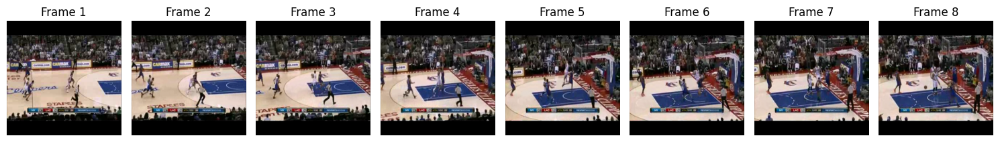

In [17]:
print(video_inputs[0].shape)
visualize_frames(video_inputs[0])

In [18]:
frame_inputs = torch.cat([video_preprocessing_middle_frame(video) for video in videos], 0).float().cuda()

torch.Size([1, 3, 224, 224])


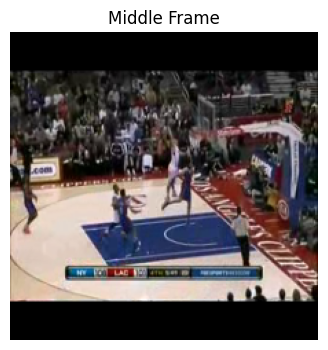

In [19]:
print(frame_inputs[0].shape)
visualize_frames(inputs=frame_inputs[0])

# Model Application

In [20]:
def model_inference(visual_inputs, text_inputs):
    videoclip = VideoCLIP_XL()
    state_dict = torch.load("/kaggle/working/VideoCLIP-XL-v2/VideoCLIP-XL-v2.bin", map_location="cpu")
    videoclip.load_state_dict(state_dict)
    videoclip.cuda().eval()
    
    with torch.inference_mode():
        visual_features = videoclip.vision_model.get_vid_features(visual_inputs).float()
        text_features = videoclip.text_model.encode_text(text_inputs).float()
    
        visual_features /= visual_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
    
    
    similarity = text_features.cpu().numpy() @ visual_features.cpu().numpy().T
    text_probs = (100.0 * visual_features @ text_features.T).softmax(dim=-1)
    top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

    return similarity, top_probs, top_labels

## Video Clip

In [21]:
similarity, top_probs, top_labels = model_inference(video_inputs, text_inputs)

## Single Frame

In [22]:
frame_similarity, frame_top_probs, frame_top_labels = model_inference(frame_inputs, text_inputs)

# Evaluation

## Cosine Similarity

Text(0.5, 1.0, 'Cosine similarity between text and video features')

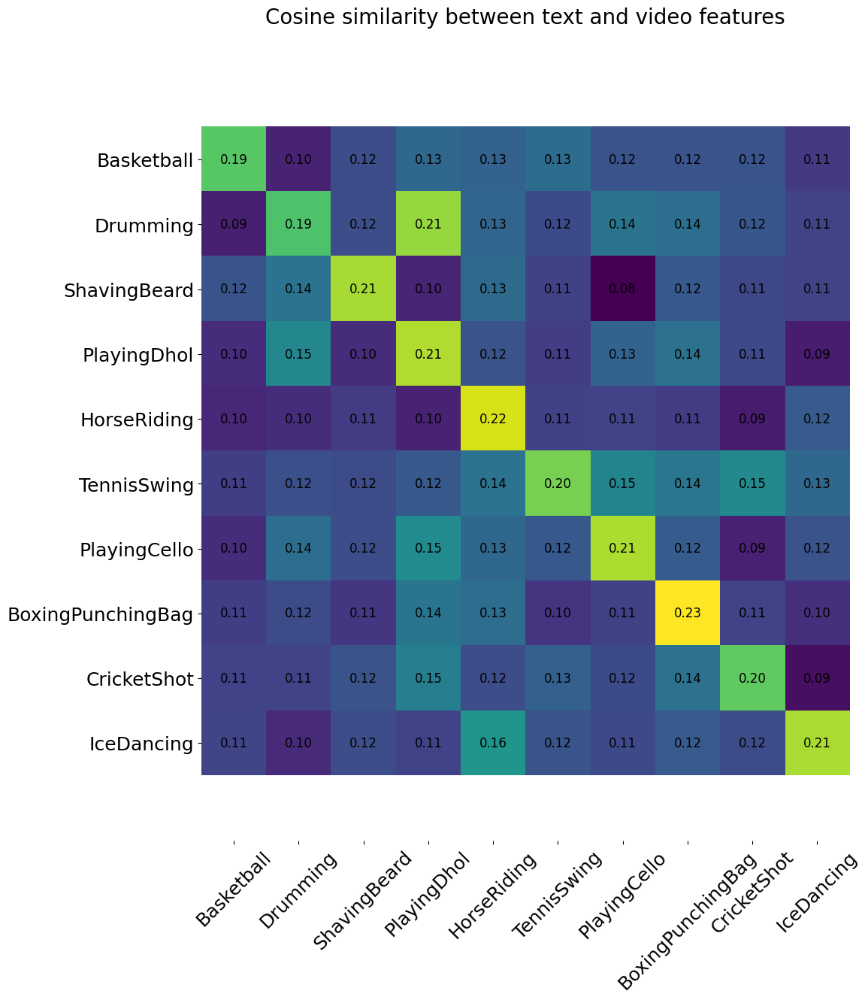

In [60]:
## Video Clips
count = len(texts)

plt.figure(figsize=(20,14))
plt.imshow(similarity)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks(range(count), texts, fontsize=18, rotation=45)

# for i, label in enumerate(texts):
#     plt.text()

for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.savefig('cosine sim. text and video.png') 
plt.title("Cosine similarity between text and video features", size=20)

Text(0.5, 1.0, 'Cosine similarity between text and frame features')

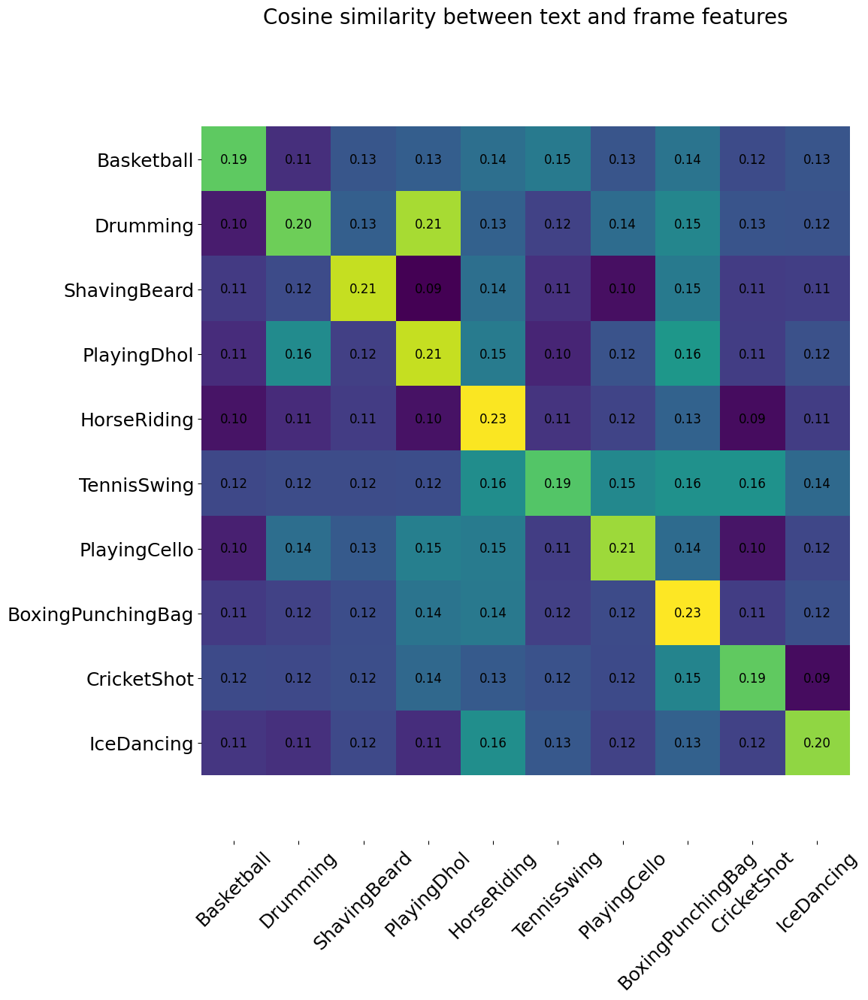

In [59]:
# single frame
count = len(texts)

plt.figure(figsize=(20,14))
plt.imshow(frame_similarity)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks(range(count), texts, fontsize=18, rotation=45)

# for i, label in enumerate(texts):
#     plt.text()

for x in range(frame_similarity.shape[1]):
    for y in range(frame_similarity.shape[0]):
        plt.text(x, y, f"{frame_similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.savefig('cosine sim. text and frame.png') 
plt.title("Cosine similarity between text and frame features", size=20)

## Top-K Accuracy

In [40]:
def arrange_results(result_labels, result_probs):
    results = []
    for video_path, gt_label, pred_labels, probs in zip(
        video_zero_shot['clip_path'], 
        video_zero_shot['label'],
        result_labels.cpu().numpy(), 
        result_probs.cpu().numpy()
    ):
        results.append({
                    "video": str(video_path),
                    "ground_truth": gt_label,
                    "top_k": {
                        idx2label[pred_label]: round(float(prob) * 100, 2) 
                        for pred_label, prob in zip(pred_labels, probs)
                    } 
                        
                    
                })
    return results


def show_results(results):
    print(f"Ground Truth: {results['ground_truth']}")
    print("Top-5 Prediction:")
    for label, prob in video_results[0]["top_k"].items():
        print(f"label: {label} - prob: {prob}")

    videopath = DATA_DIR + results['video']
    videoclip = VideoFileClip(videopath)
    return videoclip.ipython_display(width=500)

### Video Clip

In [37]:
video_results = arrange_results(top_labels, top_probs)
video_results

[{'video': '/test/Basketball/v_BasketballDunk_g14_c01.avi',
  'ground_truth': 'Basketball',
  'top_k': {'Basketball': 99.78,
   'ShavingBeard': 0.07,
   'IceDancing': 0.03,
   'CricketShot': 0.03,
   'TennisSwing': 0.02}},
 {'video': '/test/Drumming/v_Drumming_g23_c05.avi',
  'ground_truth': 'Drumming',
  'top_k': {'Drumming': 96.8,
   'PlayingDhol': 2.01,
   'ShavingBeard': 0.56,
   'PlayingCello': 0.43,
   'TennisSwing': 0.07}},
 {'video': '/test/ShavingBeard/v_ShavingBeard_g09_c06.avi',
  'ground_truth': 'ShavingBeard',
  'top_k': {'ShavingBeard': 99.95,
   'CricketShot': 0.01,
   'PlayingCello': 0.01,
   'Drumming': 0.01,
   'IceDancing': 0.01}},
 {'video': '/test/PlayingDhol/v_PlayingDhol_g02_c03.avi',
  'ground_truth': 'PlayingDhol',
  'top_k': {'PlayingDhol': 64.39,
   'Drumming': 35.33,
   'PlayingCello': 0.15,
   'CricketShot': 0.07,
   'BoxingPunchingBag': 0.04}},
 {'video': '/test/HorseRiding/v_HorseRiding_g07_c03.avi',
  'ground_truth': 'HorseRiding',
  'top_k': {'HorseRidi

In [41]:
show_results(video_results[0])

Ground Truth: Basketball
Top-5 Prediction:
label: Basketball - prob: 99.78
label: ShavingBeard - prob: 0.07
label: IceDancing - prob: 0.03
label: CricketShot - prob: 0.03
label: TennisSwing - prob: 0.02
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [42]:
show_results(video_results[1])

Ground Truth: Drumming
Top-5 Prediction:
label: Basketball - prob: 99.78
label: ShavingBeard - prob: 0.07
label: IceDancing - prob: 0.03
label: CricketShot - prob: 0.03
label: TennisSwing - prob: 0.02
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [43]:
show_results(video_results[3])

Ground Truth: PlayingDhol
Top-5 Prediction:
label: Basketball - prob: 99.78
label: ShavingBeard - prob: 0.07
label: IceDancing - prob: 0.03
label: CricketShot - prob: 0.03
label: TennisSwing - prob: 0.02
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Frame

In [44]:
frame_results = arrange_results(frame_top_labels, frame_top_probs)
frame_results

[{'video': '/test/Basketball/v_BasketballDunk_g14_c01.avi',
  'ground_truth': 'Basketball',
  'top_k': {'Basketball': 99.71,
   'CricketShot': 0.07,
   'TennisSwing': 0.07,
   'BoxingPunchingBag': 0.04,
   'ShavingBeard': 0.03}},
 {'video': '/test/Drumming/v_Drumming_g23_c05.avi',
  'ground_truth': 'Drumming',
  'top_k': {'Drumming': 97.72,
   'PlayingDhol': 1.71,
   'PlayingCello': 0.33,
   'TennisSwing': 0.06,
   'ShavingBeard': 0.05}},
 {'video': '/test/ShavingBeard/v_ShavingBeard_g09_c06.avi',
  'ground_truth': 'ShavingBeard',
  'top_k': {'ShavingBeard': 99.9,
   'Drumming': 0.02,
   'PlayingCello': 0.02,
   'Basketball': 0.01,
   'CricketShot': 0.01}},
 {'video': '/test/PlayingDhol/v_PlayingDhol_g02_c03.avi',
  'ground_truth': 'PlayingDhol',
  'top_k': {'PlayingDhol': 64.4,
   'Drumming': 35.41,
   'PlayingCello': 0.09,
   'BoxingPunchingBag': 0.05,
   'CricketShot': 0.03}},
 {'video': '/test/HorseRiding/v_HorseRiding_g07_c03.avi',
  'ground_truth': 'HorseRiding',
  'top_k': {'Hor

### Comparison

In [52]:
comparison = []
for clip, frame in zip(video_results, frame_results):
    assert clip['video'] == frame['video']

    row = {
        'video': clip['video'],
        'ground_truth': clip['ground_truth'],
        'clip_pred': next(iter(clip["top_k"].items()))[0],
        'clip_prob': next(iter(clip["top_k"].items()))[1],
        'frame_pred': next(iter(frame["top_k"].items()))[0],
        'frame_prob': next(iter(frame["top_k"].items()))[1],
        'clip_correct': next(iter(clip["top_k"].items()))[0] == clip['ground_truth'],
        'frame_correct': next(iter(frame["top_k"].items()))[0] == frame['ground_truth']
    }
    comparison.append(row)

In [55]:
df_comparison = pd.DataFrame(comparison)
df_comparison

,video,ground_truth,clip_pred,clip_prob,frame_pred,frame_prob,clip_correct,frame_correct
0,/test/Basketball/v_BasketballDunk_g14_c01.avi,Basketball,Basketball,99.78,Basketball,99.71,True,True
1,/test/Drumming/v_Drumming_g23_c05.avi,Drumming,Drumming,96.80,Drumming,97.72,True,True
2,/test/ShavingBeard/v_ShavingBeard_g09_c06.avi,ShavingBeard,ShavingBeard,99.95,ShavingBeard,99.90,True,True
3,/test/PlayingDhol/v_PlayingDhol_g02_c03.avi,PlayingDhol,PlayingDhol,64.39,PlayingDhol,64.40,True,True
4,/test/HorseRiding/v_HorseRiding_g07_c03.avi,HorseRiding,HorseRiding,99.74,HorseRiding,99.64,True,True
5,/test/TennisSwing/v_TennisSwing_g12_c04.avi,TennisSwing,TennisSwing,99.68,TennisSwing,98.27,True,True
6,/test/PlayingCello/v_PlayingCello_g23_c02.avi,PlayingCello,PlayingCello,99.73,PlayingCello,99.27,True,True
7,/test/BoxingPunchingBag/v_BoxingPunchingBag_g0...,BoxingPunchingBag,BoxingPunchingBag,99.96,BoxingPunchingBag,99.53,True,True
8,/test/CricketShot/v_CricketShot_g24_c06.avi,CricketShot,CricketShot,98.45,CricketShot,96.38,True,True
9,/test/IceDancing/v_IceDancing_g13_c01.avi,IceDancing,IceDancing,99.93,IceDancing,99.68,True,True


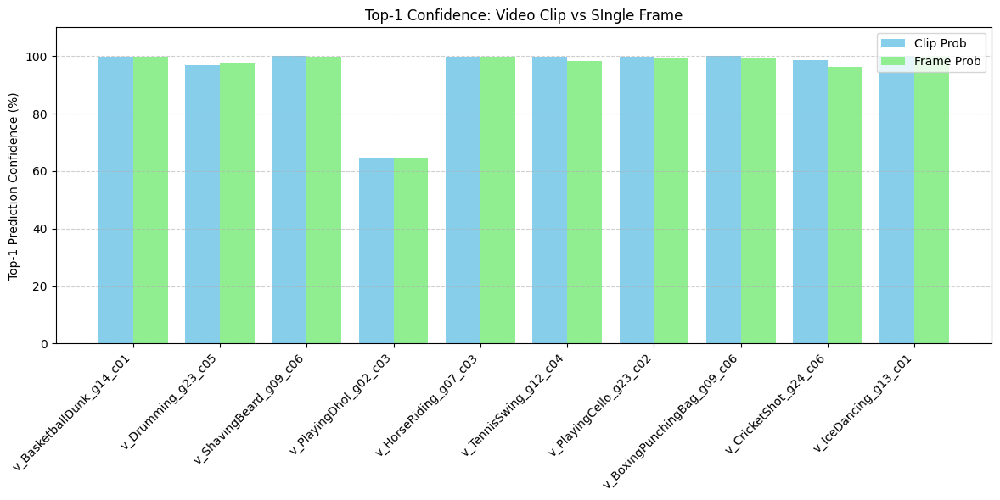

In [62]:
df = df_comparison.copy()
# get only video name
df['video_id'] = df['video'].apply(lambda x: x.split('/')[-1].replace('.avi', ''))

bar_width = 0.4
x = np.arange(len(df))

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, df['clip_prob'], width=bar_width, label='Clip Prob', color='skyblue')
plt.bar(x + bar_width/2, df['frame_prob'], width=bar_width, label='Frame Prob', color='lightgreen')

plt.xticks(x, df['video_id'], rotation=45, ha='right')
plt.ylabel("Top-1 Prediction Confidence (%)")
plt.title("Top-1 Confidence: Video Clip vs SIngle Frame")
plt.ylim(0, 110)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('video clips vs frame comparison.png') 
plt.show()